In [1]:
fname = 'data/pax-2017-07-11_06_12d_22d_mix_D200mW_A400mW.hdf5'

In [2]:
from pathlib import Path
fname = Path(fname)
assert fname.is_file(), 'File not found.'

mlabel = '_'.join(fname.stem.replace('pax-', '').replace('alex-', '').split('_')[:4])
mlabel

'2017-07-11_06_12d_22d'

In [3]:
!date

Thu Oct  5 16:11:59 PDT 2017


# Imports

In [4]:
import os
from pathlib import Path
import numpy as np
from IPython.display import display, HTML, Math
import pandas as pd
import matplotlib as mpl
mpl.rcParams['font.sans-serif'].insert(0, 'Arial')
%matplotlib inline
import matplotlib.pyplot as plt
from heatmap import heatmap48, spotsh, spotsv
import pybroom as br

/home/anto/miniconda3/envs/py36/lib/python3.6/site-packages/seaborn/apionly.py:6: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)


In [5]:
from fretbursts import *

 - Optimized (cython) burst search loaded.
 - Optimized (cython) photon counting loaded.
--------------------------------------------------------------
 You are running FRETBursts (version 0.6.5).

 If you use this software please cite the following paper:

   FRETBursts: An Open Source Toolkit for Analysis of Freely-Diffusing Single-Molecule FRET
   Ingargiola et al. (2016). http://dx.doi.org/10.1371/journal.pone.0160716 

--------------------------------------------------------------


In [6]:
sns = init_notebook(apionly=True)

In [7]:
plt.rcParams['font.size'] = 14

In [8]:
%config InlineBackend.figure_format = 'retina'

In [9]:
# Instead of importing, "load" some utility functions using `%run -i`.
# This gives these functions access to variables defined in the notebok (e.g. mlabel).
# Defines: savefig, save_name, info_html, cal_phrate, make_df_spots, make_df_bursts
#          cal_phrate_alex, make_df_bursts_alex
%run -i utils.py 

In [10]:
plot_timetraces = True
skip_ch = (12, 13)

In [11]:
save_figures = True
savefigdir = 'figures'
highres = True

# Load Data

In [12]:
d = loader.photon_hdf5(str(fname), ondisk=True)

In [13]:
info_html(d)

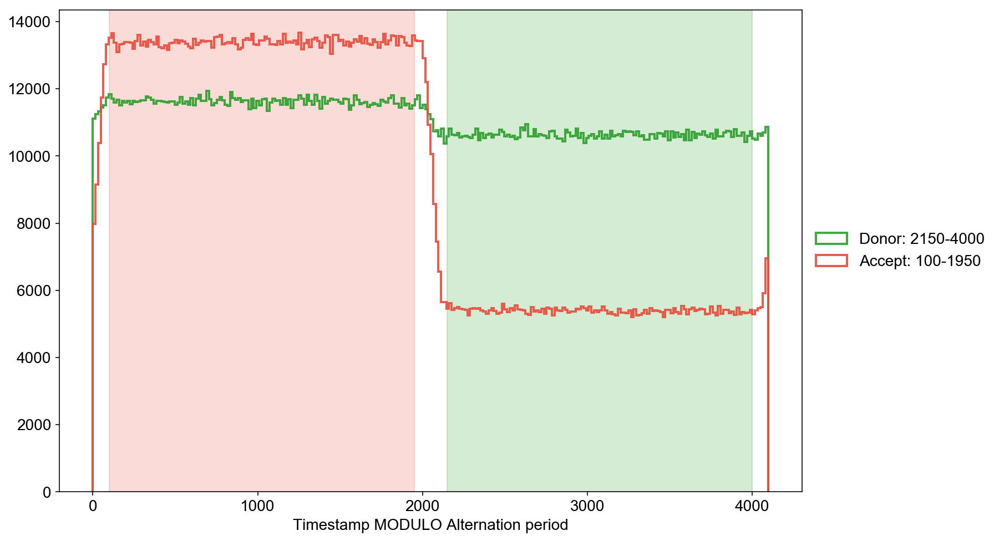

In [14]:
fig, ax = plt.subplots(figsize=(12, 8))
bpl.plot_alternation_hist_usalex(d, ax=ax, bins=np.arange(0, 4097, 16))

In [15]:
%%timeit -n1 -r1 
loader.alex_apply_period(d)

# Total photons (after ALEX selection):   287,744,125
#  D  photons in D+A excitation periods:  142,294,620
#  A  photons in D+A excitation periods:  145,449,505
# D+A photons in  D  excitation period:   110,565,293
# D+A photons in  A  excitation period:   177,178,832

1min 6s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


# Analysis

## Timetraces

Saved: figures/2017-07-11_06_12d_22d_2017-07-11_06_12d_22d_timetrace_t=1-2.png.png
Saved hires: figures/2017-07-11_06_12d_22d_2017-07-11_06_12d_22d_timetrace_t=1-2_highres.png
Saved: figures/2017-07-11_06_12d_22d_2017-07-11_06_12d_22d_timetrace_t=155-156.png.png
Saved hires: figures/2017-07-11_06_12d_22d_2017-07-11_06_12d_22d_timetrace_t=155-156_highres.png
Saved: figures/2017-07-11_06_12d_22d_2017-07-11_06_12d_22d_timetrace_t=309-310.png.png
Saved hires: figures/2017-07-11_06_12d_22d_2017-07-11_06_12d_22d_timetrace_t=309-310_highres.png
Saved: figures/2017-07-11_06_12d_22d_2017-07-11_06_12d_22d_timetrace_t=463-464.png.png
Saved hires: figures/2017-07-11_06_12d_22d_2017-07-11_06_12d_22d_timetrace_t=463-464_highres.png
Saved: figures/2017-07-11_06_12d_22d_2017-07-11_06_12d_22d_timetrace_t=617-618.png.png
Saved hires: figures/2017-07-11_06_12d_22d_2017-07-11_06_12d_22d_timetrace_t=617-618_highres.png


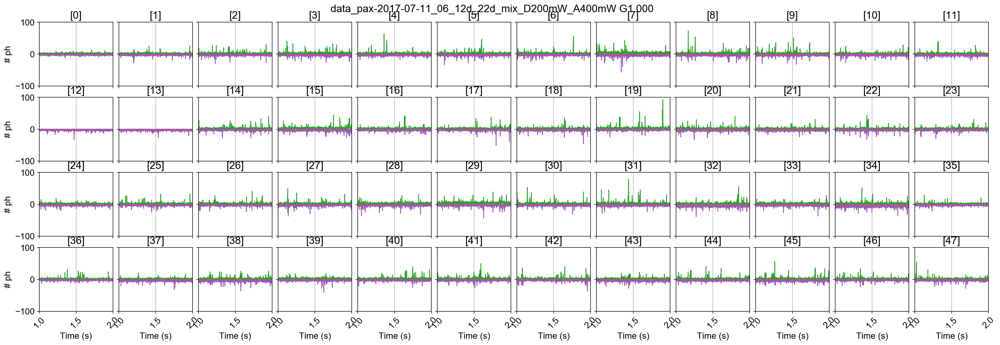

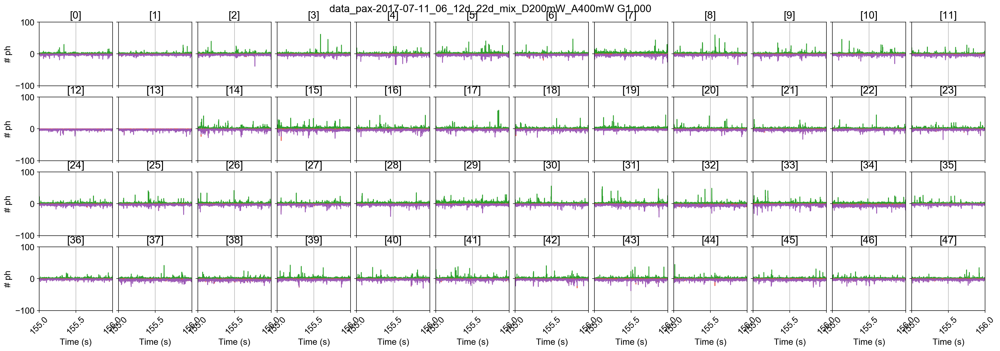

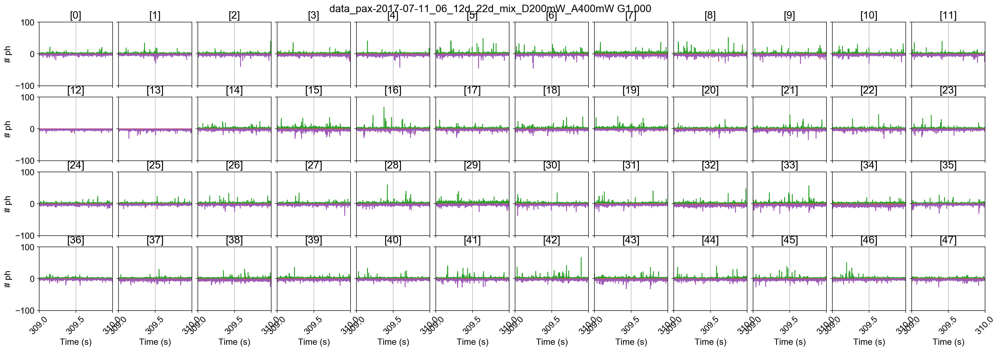

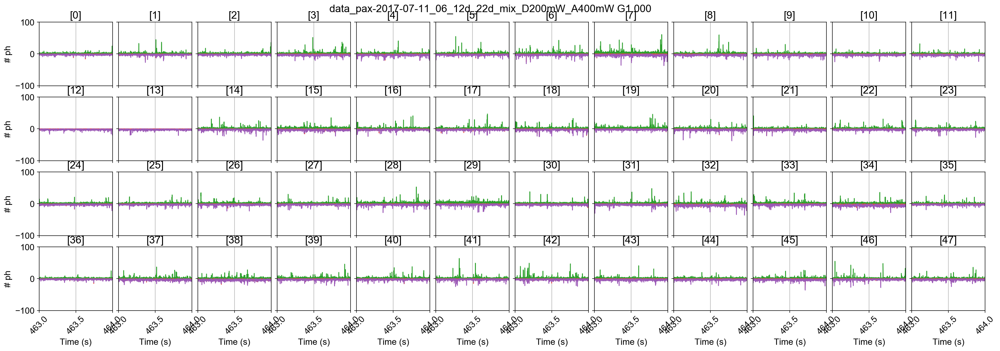

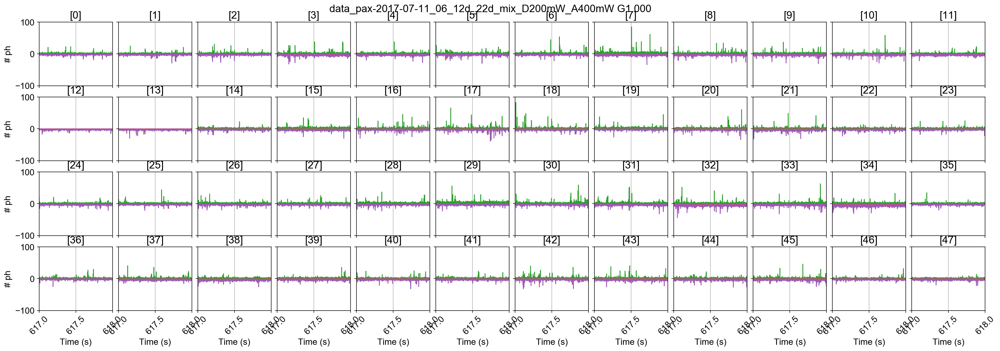

In [16]:
if plot_timetraces:
    num_time_points = 5
    kws = dict(figsize=(24, 8), xrotation=45)
    
    # Timepoints equally distributed along the measurement
    time_points = np.round(np.linspace(d.time_min+1, d.time_max-2, num=num_time_points))

    for i in time_points:
        dplot(d, timetrace, tmin=i, tmax=i+1, **kws);
        plt.ylim(-100, 100)
        savefig("%s_timetrace_t=%d-%d.png" % (mlabel, i, i+1))

## Background

In [17]:
d.calc_bg_cache(bg.exp_fit, time_s=5, tail_min_us='auto', F_bg=1.7)

 * Loading BG rates from cache ... 
 - Loading bakground data:  [DONE]


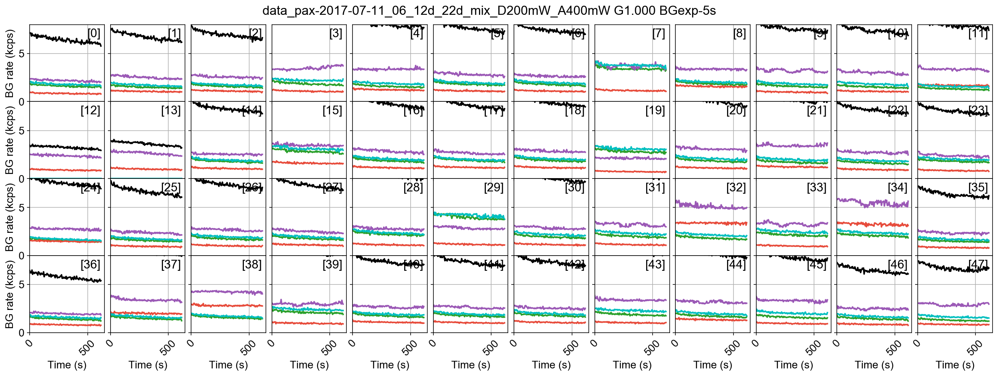

In [18]:
ax = dplot(d, timetrace_bg, show_da=True, hspace=0, wspace=0.08,
           plot_style=dict(marker=None), title='right top', 
           title_kws=dict(fontsize=16), xrotation=45);
plt.xlim(0)
plt.ylim(0, 8);

In [19]:
bg_AexDem = d.bg_from(Ph_sel(Aex='Dem'))
bg_AexAem = d.bg_from(Ph_sel(Aex='Aem'))
bg_DexDem = d.bg_from(Ph_sel(Dex='Dem'))
bg_DexAem = d.bg_from(Ph_sel(Dex='Aem'))

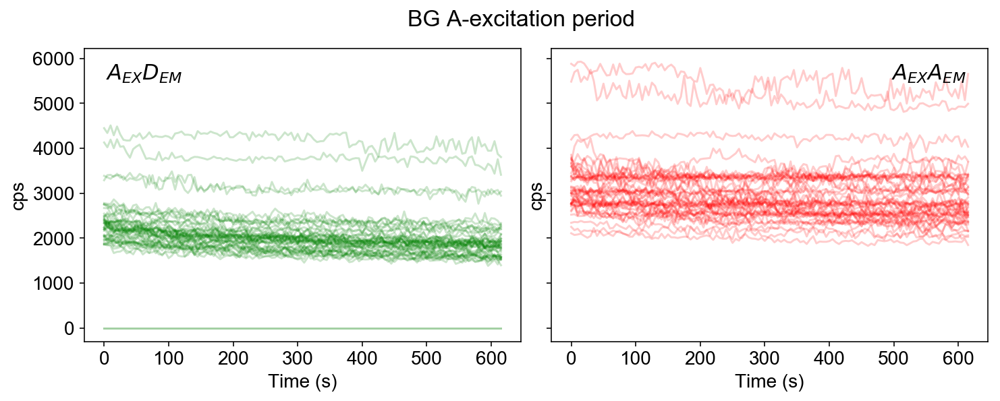

In [20]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharex=True, sharey=True)
fig.suptitle("BG A-excitation period")
t = np.arange(len(bg_AexDem[0])) * 5
ax[0].plot(t, np.array(bg_AexDem).T, color='g', alpha=0.2);
ax[1].plot(t, np.array(bg_AexAem).T, color='r', alpha=0.2);
plt.setp(ax, xlabel='Time (s)', ylabel='cps')
plt.subplots_adjust(wspace=0.07)
ax[0].text(0.05, 0.95, '$A_{EX}D_{EM}$', va='top', fontsize=16, transform=ax[0].transAxes)
ax[1].text(0.95, 0.95, '$A_{EX}A_{EM}$', va='top', ha='right', fontsize=16, transform=ax[1].transAxes);

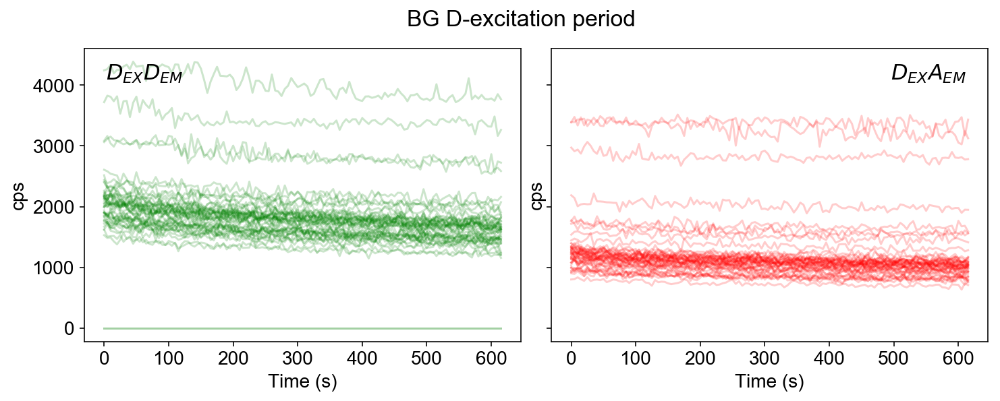

In [21]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharex=True, sharey=True)
fig.suptitle("BG D-excitation period")
t = np.arange(len(bg_DexDem[0])) * 5
ax[0].plot(t, np.array(bg_DexDem).T, color='g', alpha=0.2);
ax[1].plot(t, np.array(bg_DexAem).T, color='r', alpha=0.2);
plt.setp(ax, xlabel='Time (s)', ylabel='cps')
plt.subplots_adjust(wspace=0.07)
ax[0].text(0.05, 0.95, '$D_{EX}D_{EM}$', va='top', fontsize=16, transform=ax[0].transAxes)
ax[1].text(0.95, 0.95, '$D_{EX}A_{EM}$', va='top', ha='right', fontsize=16, transform=ax[1].transAxes);

## Burst search

In [22]:
d.burst_search(min_rate_cps=50e3, pax=True)

 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   [DONE Counting D/A]


In [23]:
kws = dict(skip_ch=skip_ch, hspace=0, wspace=0, top=0.96, 
           title_bg=False, title_nbursts=False, title='in')

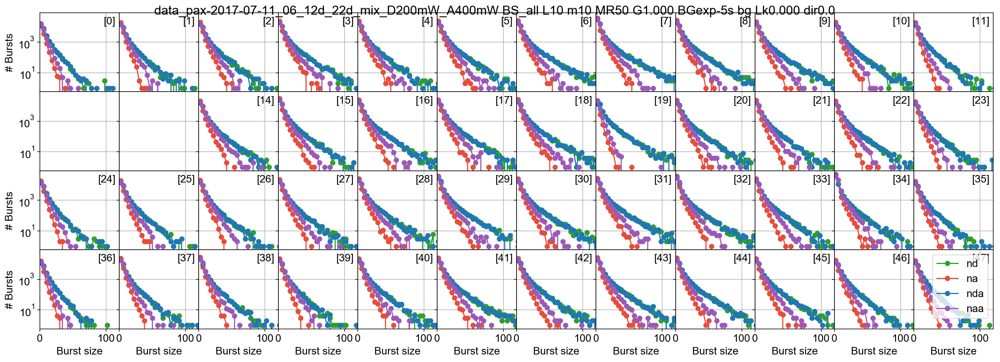

In [24]:
dplot(d, hist_size_all, **kws);
plt.xlim(0, 120)
plt.legend();

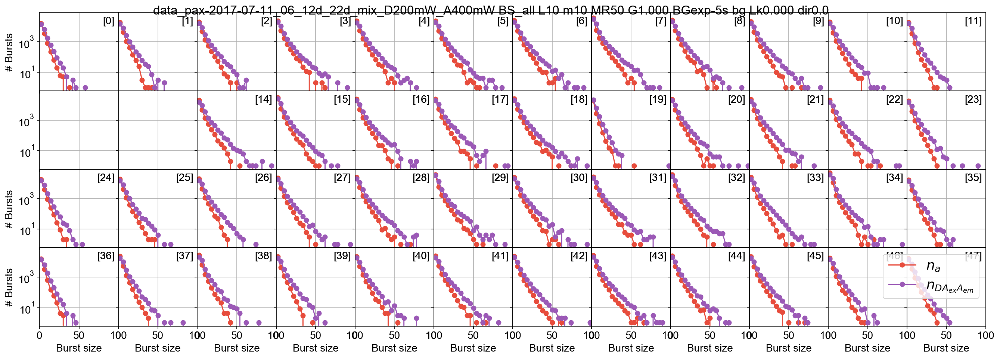

In [25]:
kws.update(title_nbursts=False)
ax = dplot(d, hist_size, which='na', **kws);
dplot(d, hist_size, which='naa', AX=ax, **kws);
plt.xlim(0, 100);
plt.legend(['$n_a$', '$n_{DA_{ex}A_{em}}$'], fontsize=18, loc='upper right')

<IPython.core.display.Math object>

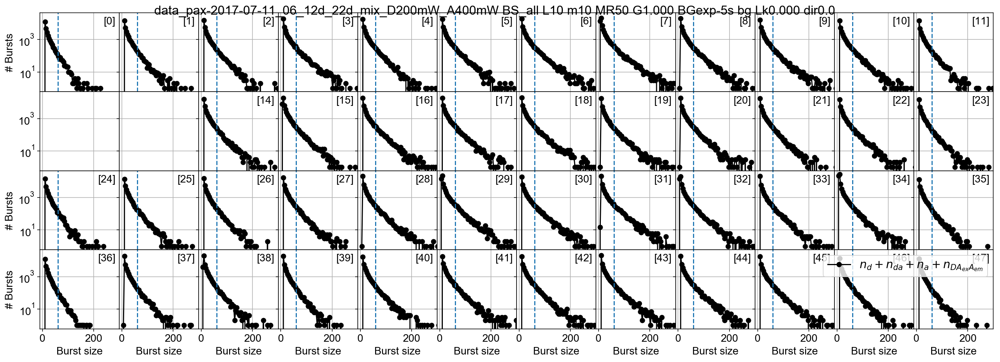

In [26]:
size_th = 60
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'),
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dplot(d, hist_size, vline=size_th, **size_sel_kws, **kws);
plt.xlim(-10, 300)
plt.legend(fontsize=15, loc='upper right');
Math(d._burst_sizes_pax_formula(**size_sel_kws))

In [27]:
bs_mean = []
for i in range(48):
    sizes_ch = d.burst_sizes_pax_ich(i, **size_sel_kws) 
    tail = sizes_ch > size_th
    bs_mean.append(sizes_ch[tail].mean() - size_th)

Saved: figures/2017-07-11_06_12d_22d_heatmap_burst_sizes.png
Saved hires: figures/2017-07-11_06_12d_22d_heatmap_burst_sizes_highres.png


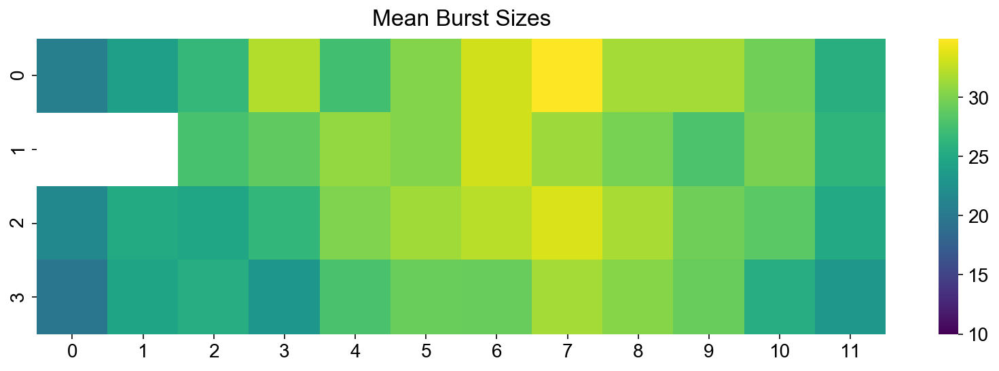

In [28]:
heatmap48(bs_mean, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Sizes", vmin=10)
savefig('heatmap_burst_sizes')

(-0.5, 4)

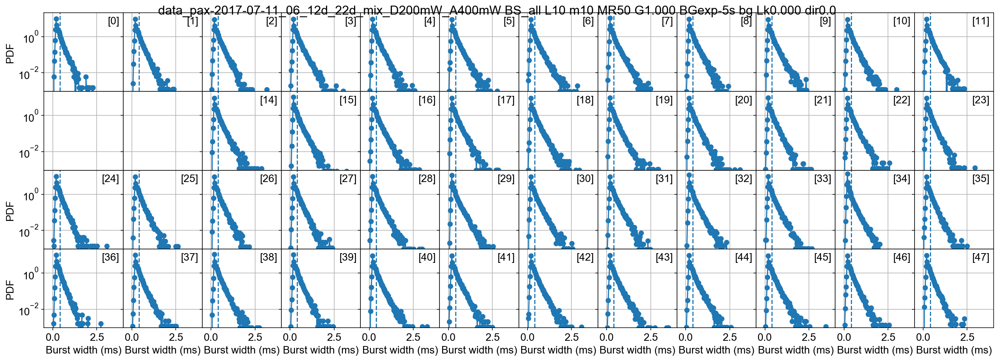

In [29]:
width_th = 0.4
dplot(d, hist_width, vline=width_th, **kws);
plt.xlim(-0.5, 4)

In [30]:
bw_mean = []
for i in range(48):
    widths_ch = d.mburst[i].width * d.clk_p * 1e3
    tail = widths_ch > width_th
    bw_mean.append(widths_ch[tail].mean() - width_th)

Saved: figures/2017-07-11_06_12d_22d_heatmap_burst_widths.png
Saved hires: figures/2017-07-11_06_12d_22d_heatmap_burst_widths_highres.png


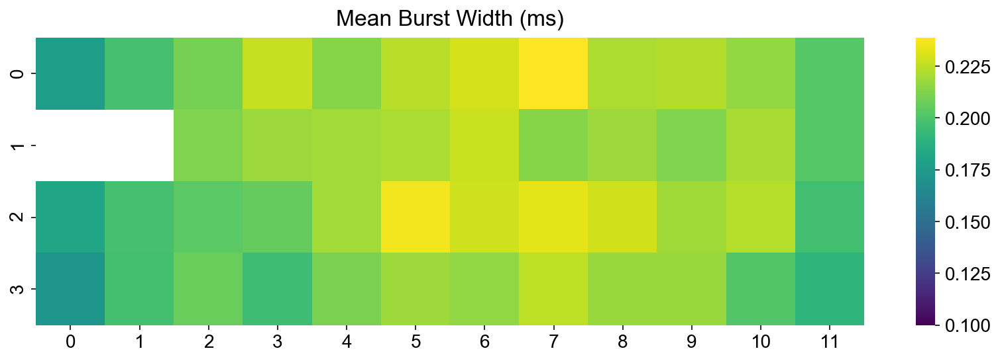

In [31]:
heatmap48(bw_mean, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Width (ms)", vmin=0.1)
savefig('heatmap_burst_widths')

In [32]:
# Use recompute=True if changing burst-search parameters
recompute = False
phrates = {}
streams = ('all', 'DexDem', 'AexDem', 'DexAem', 'AexAem', )
for stream in streams:
    print(' - Computing peak photon rates for %6s stream.' % str(Ph_sel.from_str(stream)))
    cal_phrate(d, stream=Ph_sel.from_str(stream), phrates=phrates, recompute=recompute)

 - Computing peak photon rates for    all stream.
   Valid fraction (mean of all ch): 100.0 %
 - Computing peak photon rates for DexDem stream.
   Valid fraction (mean of all ch): 18.7 %
 - Computing peak photon rates for AexDem stream.
   Valid fraction (mean of all ch): 19.0 %
 - Computing peak photon rates for DexAem stream.
   Valid fraction (mean of all ch): 5.1 %
 - Computing peak photon rates for AexAem stream.
   Valid fraction (mean of all ch): 15.0 %


Saved: figures/2017-07-11_06_12d_22d_peak_phrate_all.png
Saved hires: figures/2017-07-11_06_12d_22d_peak_phrate_all_highres.png


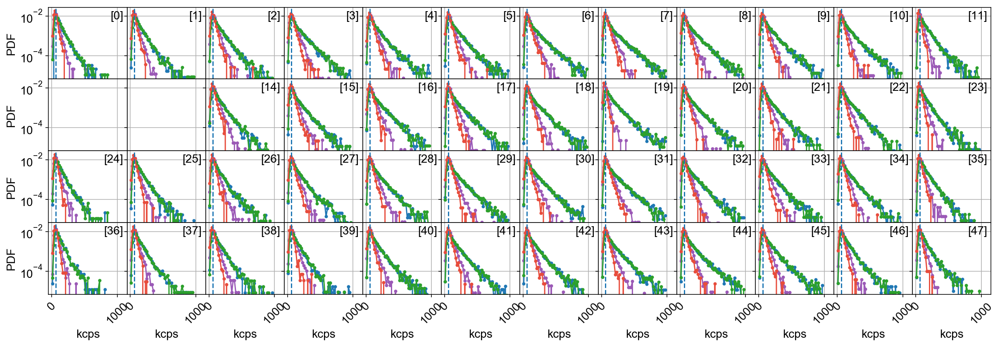

In [33]:
kws = dict(figsize=(18, 6), skip_ch=skip_ch, wspace=0, hspace=0, grid=True, 
           title=None, title_nbursts=False, title_bg=False, xrotation=45)

ax = dplot(phrates['AexAemB'], hist_burst_phrate, 
           plot_style=dict(color=bpl.purple, ms=3), **kws);
dplot(phrates['AexDemB'], hist_burst_phrate, 
      plot_style=dict(color='C0', ms=3), AX=ax, **kws);
dplot(phrates['DexDemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.green, ms=3), AX=ax, **kws);
kws.update(vline=60, title='in', title_nbursts=False, title_bg=False,)
dplot(phrates['DexAemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.red, ms=3), AX=ax, **kws);
plt.xlim(-50, 1150);
plt.setp(ax[:, 0], ylabel='PDF')
plt.setp(ax[-1], xlabel='kcps')
savefig('peak_phrate_all')

In [34]:
phr_th = 60e3
for stream in streams:
    phrates[stream]['mean'] = 0
    phr = phrates[stream+'B']
    for ich in range(48):
        valid = ~pd.isnull(phr[ich])
        phr_valid = phr[ich][valid]
        m = phr_valid[phr_valid >= phr_th].mean() - phr_th
        phrates[stream].loc[ich, 'mean'] = np.round(m*1e-3, 1)

In [35]:
streams

('all', 'DexDem', 'AexDem', 'DexAem', 'AexAem')

Saved: figures/2017-07-11_06_12d_22d_peak_phrate_heatmap_all.png
Saved hires: figures/2017-07-11_06_12d_22d_peak_phrate_heatmap_all_highres.png
Saved: figures/2017-07-11_06_12d_22d_peak_phrate_heatmap_DexDem.png
Saved hires: figures/2017-07-11_06_12d_22d_peak_phrate_heatmap_DexDem_highres.png
Saved: figures/2017-07-11_06_12d_22d_peak_phrate_heatmap_AexDem.png
Saved hires: figures/2017-07-11_06_12d_22d_peak_phrate_heatmap_AexDem_highres.png
Saved: figures/2017-07-11_06_12d_22d_peak_phrate_heatmap_DexAem.png
Saved hires: figures/2017-07-11_06_12d_22d_peak_phrate_heatmap_DexAem_highres.png
Saved: figures/2017-07-11_06_12d_22d_peak_phrate_heatmap_AexAem.png
Saved hires: figures/2017-07-11_06_12d_22d_peak_phrate_heatmap_AexAem_highres.png


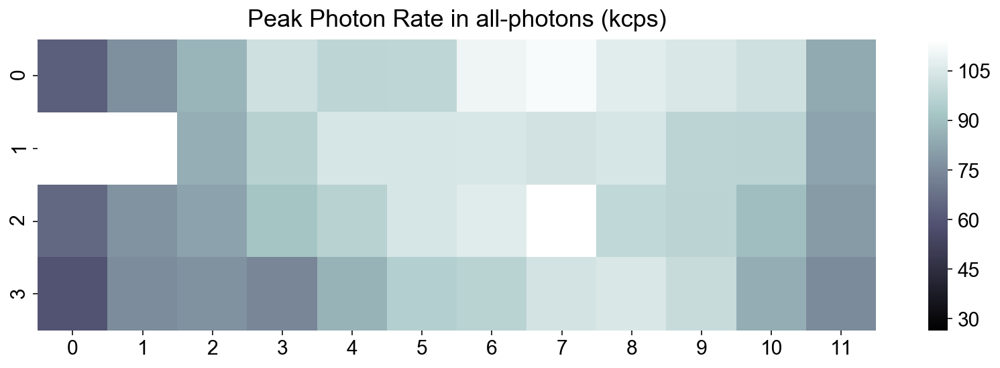

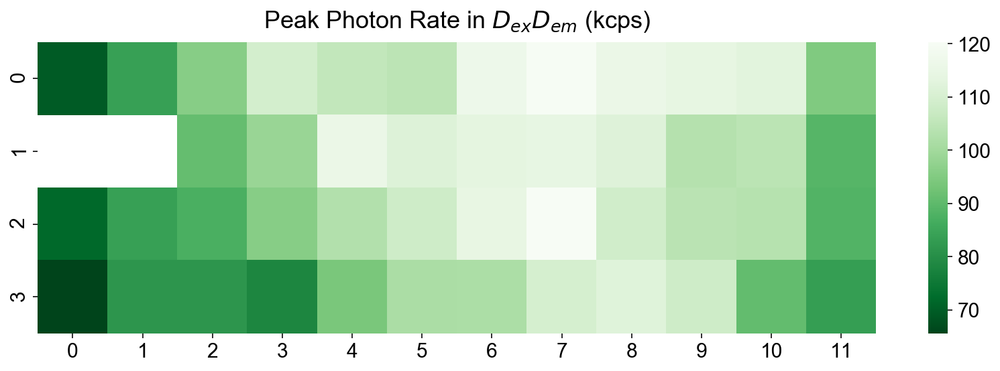

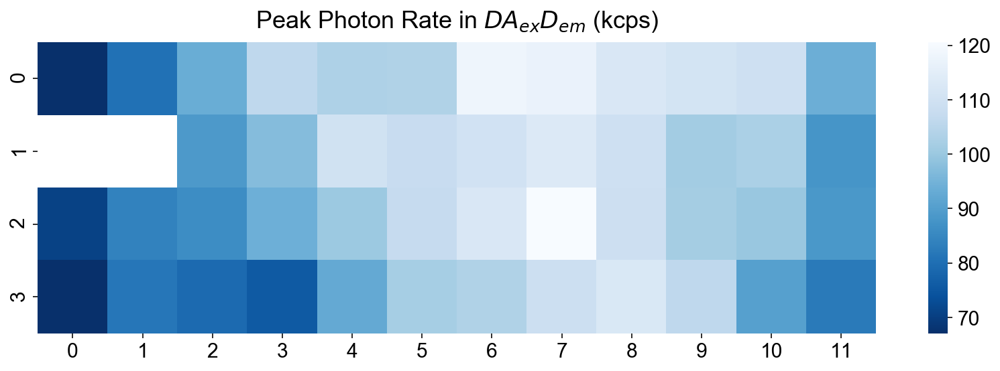

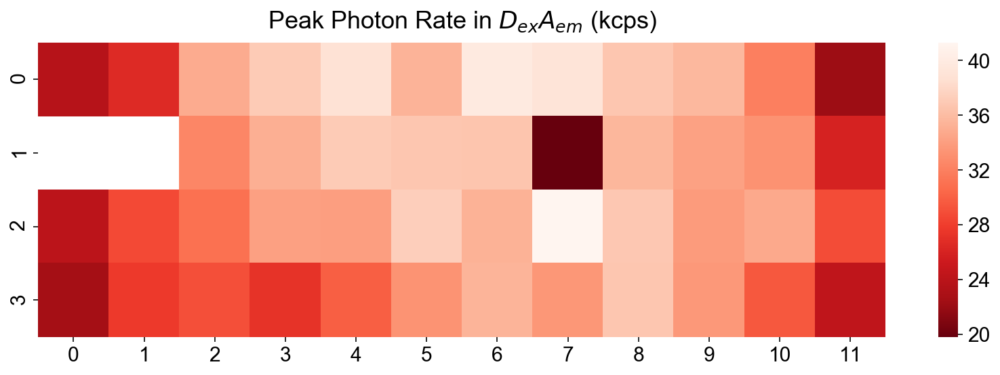

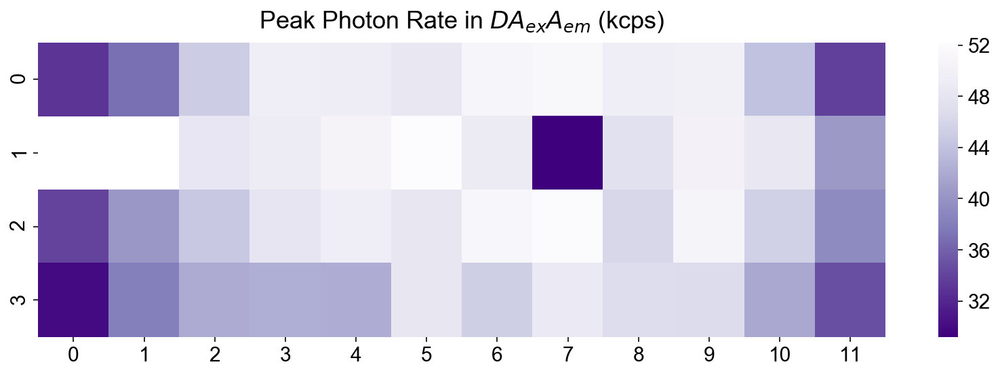

In [36]:
cmaps = ('bone', 'Greens_r', 'Blues_r', 'Reds_r', 'Purples_r')
label = {'DexDem': '$D_{ex}D_{em}$', 'DexAem': '$D_{ex}A_{em}$',
         'AexDem': '$DA_{ex}D_{em}$', 'AexAem': '$DA_{ex}A_{em}$', 'all': 'all-photons'}
with plt.rc_context({'font.size': 15}):
    for stream, cmap in zip(streams, cmaps):
        heatmap48(phrates[stream]['mean'], cmap=cmap, skip_ch=skip_ch,
                  title=r"Peak Photon Rate in %s (kcps)" % label[stream])
        savefig('peak_phrate_heatmap_%s' % stream)

## Burst selection

In [37]:
size_th = 80
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='Dem'), gamma=0.5,
                    na_comp=True, naa_comp=False, naa_aexonly=False)
ds = d.select_bursts(select_bursts.size, th1=size_th, **size_sel_kws)

Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(ds.nd, ds.na, ds.naa)]
ds.add(Su=Su)
Su2 = [(nd + nda + na)/(nd + nda + na + naa) 
       for nd, na, nda, naa in zip(ds.nd, ds.na, ds.nda, ds.naa)]
ds.add(Su2=Su2)
Math(d._burst_sizes_pax_formula(**size_sel_kws))

<IPython.core.display.Math object>

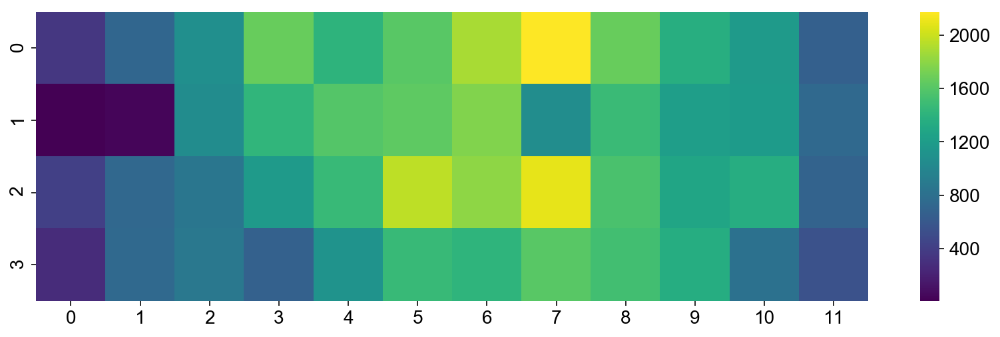

In [38]:
heatmap48(ds.num_bursts)

Saved: figures/2017-07-11_06_12d_22d_48spot_hist_E_all-bursts.png
Saved hires: figures/2017-07-11_06_12d_22d_48spot_hist_E_all-bursts_highres.png


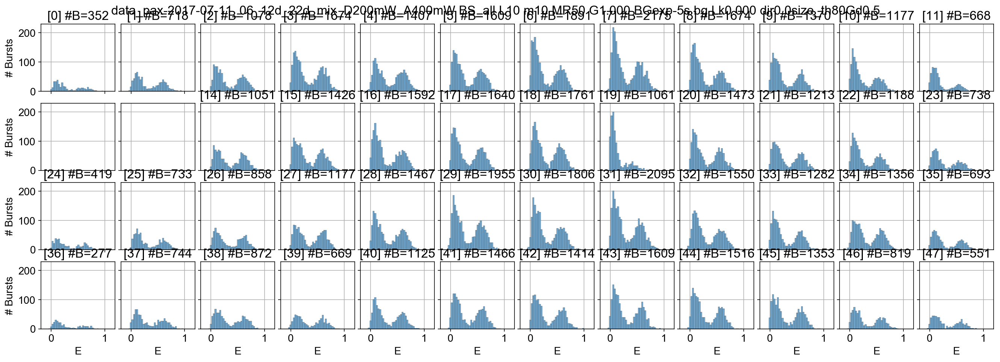

In [39]:
ax = dplot(ds, hist_fret, pdf=False, skip_ch=skip_ch);
plt.setp(ax[:, 0], ylabel='# Bursts');
# plt.ylim(0, 600);
savefig('48spot hist E all-bursts')

Saved: figures/2017-07-11_06_12d_22d_48spot_hist_Su.png
Saved hires: figures/2017-07-11_06_12d_22d_48spot_hist_Su_highres.png


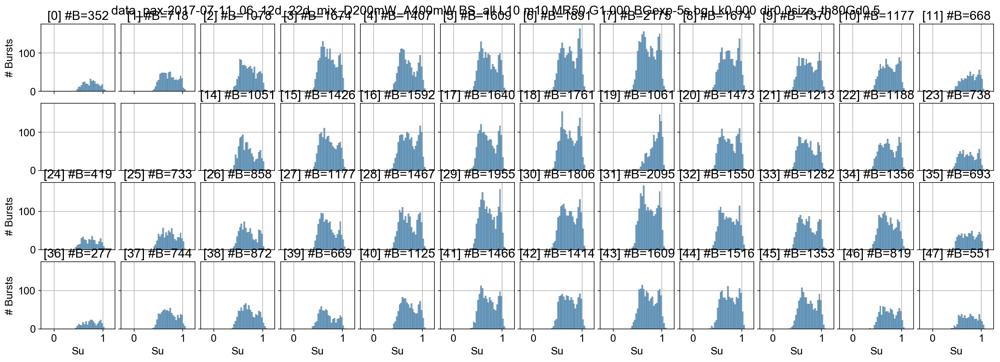

In [40]:
dplot(ds, hist_burst_data, data_name='Su', pdf=False, skip_ch=skip_ch);
plt.setp(ax[:, 0], ylabel='# Bursts');
savefig('48spot hist Su')

Saved: figures/2017-07-11_06_12d_22d_48spot_alex_hist_S_all-bursts.png
Saved hires: figures/2017-07-11_06_12d_22d_48spot_alex_hist_S_all-bursts_highres.png


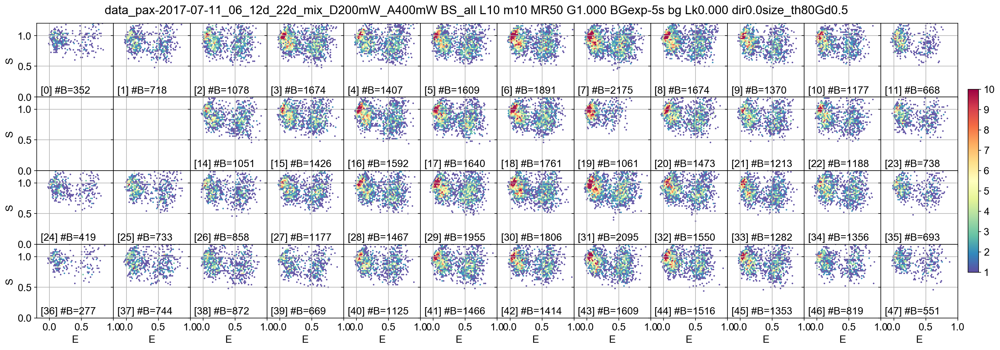

In [41]:
ax = dplot(ds, hexbin_alex, vmax=10, skip_ch=skip_ch, wspace=0, hspace=0, gridsize=60,
           title='bottom left', title_bg=False);
ax0 = ax[0,0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.colorbar(cax=cax)
plt.setp(ax[:, 0], ylabel='S');
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1]);
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2);
savefig('48spot alex hist S all-bursts')

Saved: figures/2017-07-11_06_12d_22d_48spot_alex_hist_Su_all-bursts.png
Saved hires: figures/2017-07-11_06_12d_22d_48spot_alex_hist_Su_all-bursts_highres.png


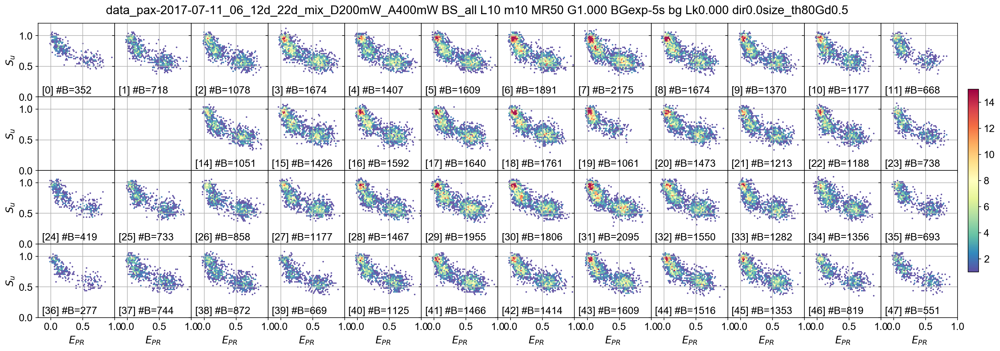

In [42]:
ax = dplot(ds, hexbin_alex, S_name='Su', vmax=15, skip_ch=skip_ch, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False);
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$');
plt.setp(ax[-1], xlabel='$E_{PR}$');
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1]);
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2);
savefig('48spot alex hist Su all-bursts')

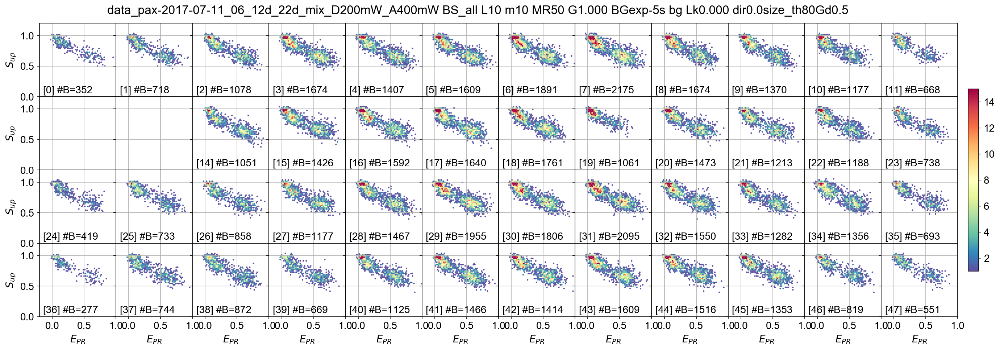

In [43]:
ax = dplot(ds, hexbin_alex, S_name='Su2', vmax=15, skip_ch=skip_ch, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False);
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_{up}$');
plt.setp(ax[-1], xlabel='$E_{PR}$');
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1]);
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2);

In [44]:
size_Dex = 80
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='Dem'), gamma=0.5,
                    na_comp=True, naa_comp=False, naa_aexonly=False)
Math(d._burst_sizes_pax_formula(**size_sel_kws))

<IPython.core.display.Math object>

In [45]:
size_Aex = 25
naa_sel_kws = dict(ph_sel=Ph_sel(Aex='Aem'), gamma=0.5,
                   na_comp=False, naa_comp=False, naa_aexonly=False)

Math(d._burst_sizes_pax_formula(**naa_sel_kws))

<IPython.core.display.Math object>

In [46]:
ds1 = d.select_bursts(select_bursts.size, th1=size_Dex, **size_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(ds1.nd, ds1.na, ds1.naa)]
ds1.add(Su=Su)
dss = ds1.select_bursts(select_bursts.size, th1=size_Aex, **naa_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dss.nd, dss.na, dss.naa)]
dss.add(Su=Su)

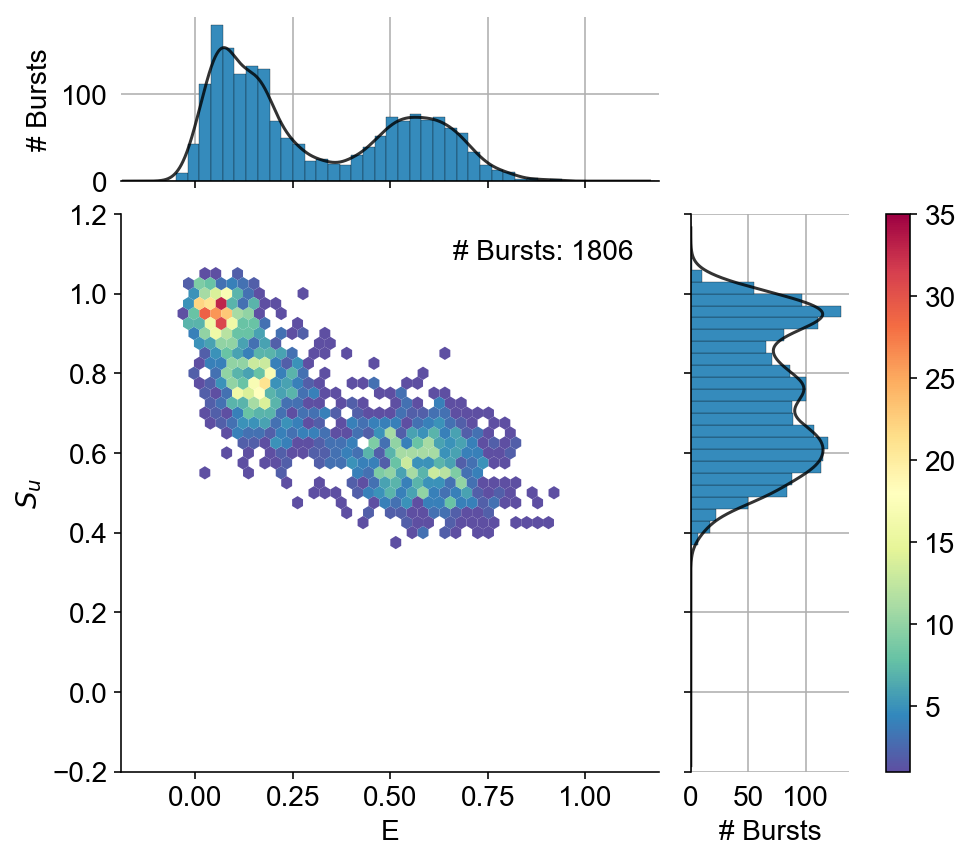

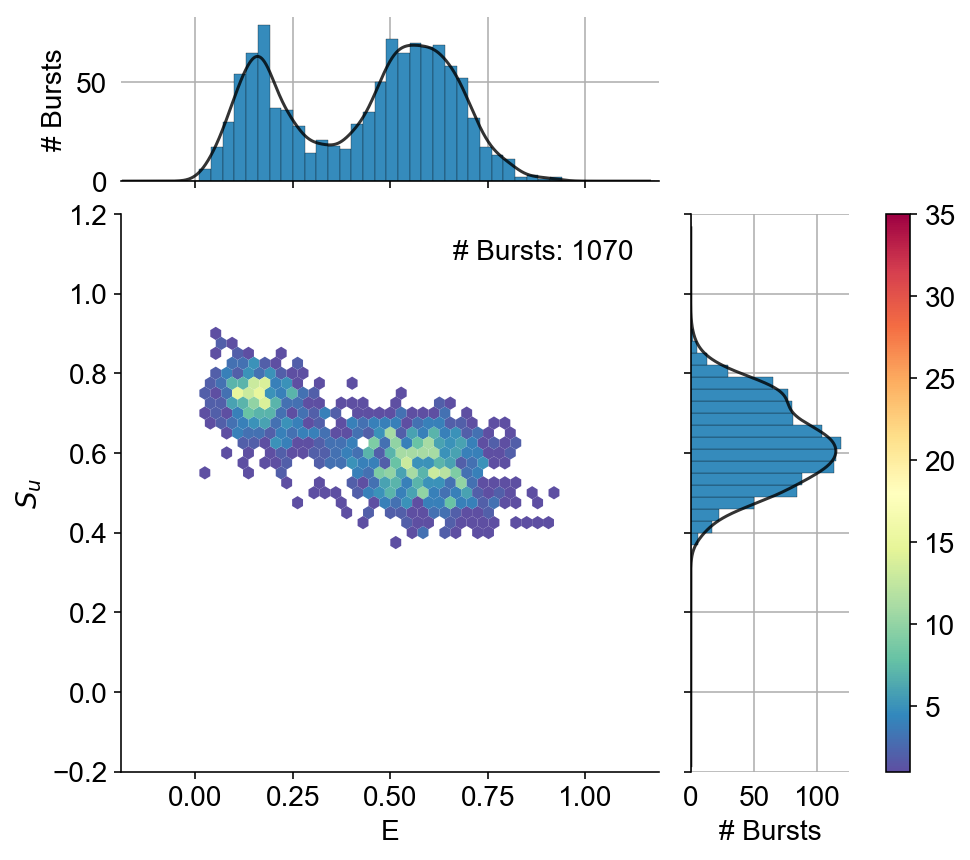

In [47]:
g = alex_jointplot(ds1, i=30, vmax=35, S_name='Su')
g.ax_joint.set_ylabel('$S_u$')
g = alex_jointplot(dss, i=30, vmax=35, S_name='Su')
g.ax_joint.set_ylabel('$S_u$')

Saved: figures/2017-07-11_06_12d_22d_48spot_alex_hist_Su_naa_AND_size_selection.png
Saved hires: figures/2017-07-11_06_12d_22d_48spot_alex_hist_Su_naa_AND_size_selection_highres.png


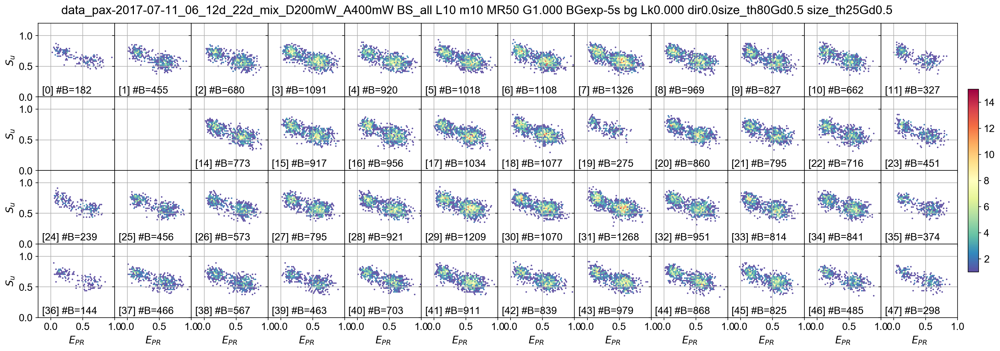

In [48]:
ax = dplot(dss, hexbin_alex, vmax=15, S_name='Su', skip_ch=skip_ch, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False);
ax0 = ax[0,0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.colorbar(cax=cax)
plt.setp(ax[:, 0], ylabel='$S_u$');
plt.setp(ax[-1], xlabel='$E_{PR}$');
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1]);
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2);
savefig('48spot alex hist Su naa AND size selection')

# Collapse

In [49]:
df = d.fuse_bursts(ms=0)

 - - - - - CHANNEL  1 - - - - 
 --> END Fused 7434 bursts (28.2%, 9 iter)

 - - - - - CHANNEL  2 - - - - 
 --> END Fused 8581 bursts (27.2%, 9 iter)

 - - - - - CHANNEL  3 - - - - 
 --> END Fused 9050 bursts (26.6%, 9 iter)

 - - - - - CHANNEL  4 - - - - 
 --> END Fused 11099 bursts (27.0%, 10 iter)

 - - - - - CHANNEL  5 - - - - 
 --> END Fused 10675 bursts (27.3%, 10 iter)

 - - - - - CHANNEL  6 - - - - 
 --> END Fused 10802 bursts (27.0%, 12 iter)

 - - - - - CHANNEL  7 - - - - 
 --> END Fused 11389 bursts (27.0%, 9 iter)

 - - - - - CHANNEL  8 - - - - 
 --> END Fused 16790 bursts (27.8%, 11 iter)

 - - - - - CHANNEL  9 - - - - 
 --> END Fused 11530 bursts (27.0%, 9 iter)

 - - - - - CHANNEL 10 - - - - 
 --> END Fused 9403 bursts (26.0%, 12 iter)

 - - - - - CHANNEL 11 - - - - 
 --> END Fused 8743 bursts (26.1%, 9 iter)

 - - - - - CHANNEL 12 - - - - 
 --> END Fused 8301 bursts (27.6%, 13 iter)

 - - - - - CHANNEL 13 - - - - 
 --> END Fused 1315 bursts (24.3%, 6 iter)

 - - - - - CH

In [50]:
dc = d.collapse(update_gamma=False, skip_ch=skip_ch)  ## check that chi_ch is set to 1 here

In [51]:
d.num_bursts.sum()

1801572

In [52]:
def sel_raw_naa(d, ich=0, th1=20, th2=np.inf, gamma=1., beta=1., donor_ref=True):
    assert th1 <= th2, 'th1 (%.2f) must be <= of th2 (%.2f)' % (th1, th2)
    kws = dict(ich=ich, gamma=gamma, beta=beta, donor_ref=donor_ref)
    naa_term = d.naa[ich]
    bursts_mask = (naa_term >= th1) * (naa_term <= th2)
    return bursts_mask, ''

def sel_ndex_na(d, ich=0, th1=20, th2=np.inf, gamma=1):
    assert th1 <= th2, 'th1 (%.2f) must be <= of th2 (%.2f)' % (th1, th2)
    size = d.nd[ich] + d.nda[ich] + d.na[ich] / gamma
    bursts_mask = (size >= th1) * (size <= th2)
    return bursts_mask, ''

In [53]:
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='Dem'), gamma=0.5,
                    na_comp=True, naa_comp=False, naa_aexonly=False)

Math(d._burst_sizes_pax_formula(**size_sel_kws))

<IPython.core.display.Math object>

In [54]:
naa_sel_kws = dict(ph_sel=Ph_sel(Aex='Aem'), gamma=1,
                   na_comp=False, naa_comp=False, naa_aexonly=False)

Math(d._burst_sizes_pax_formula(**naa_sel_kws))

<IPython.core.display.Math object>

In [55]:
dcs_th1 = d.select_bursts(select_bursts.size, th1=10, **naa_sel_kws)
dcs_th2 = dcs_th1.select_bursts(select_bursts.size, th1=20, **size_sel_kws)
dcs_th = dcs_th2.collapse(update_gamma=False, skip_ch=skip_ch)

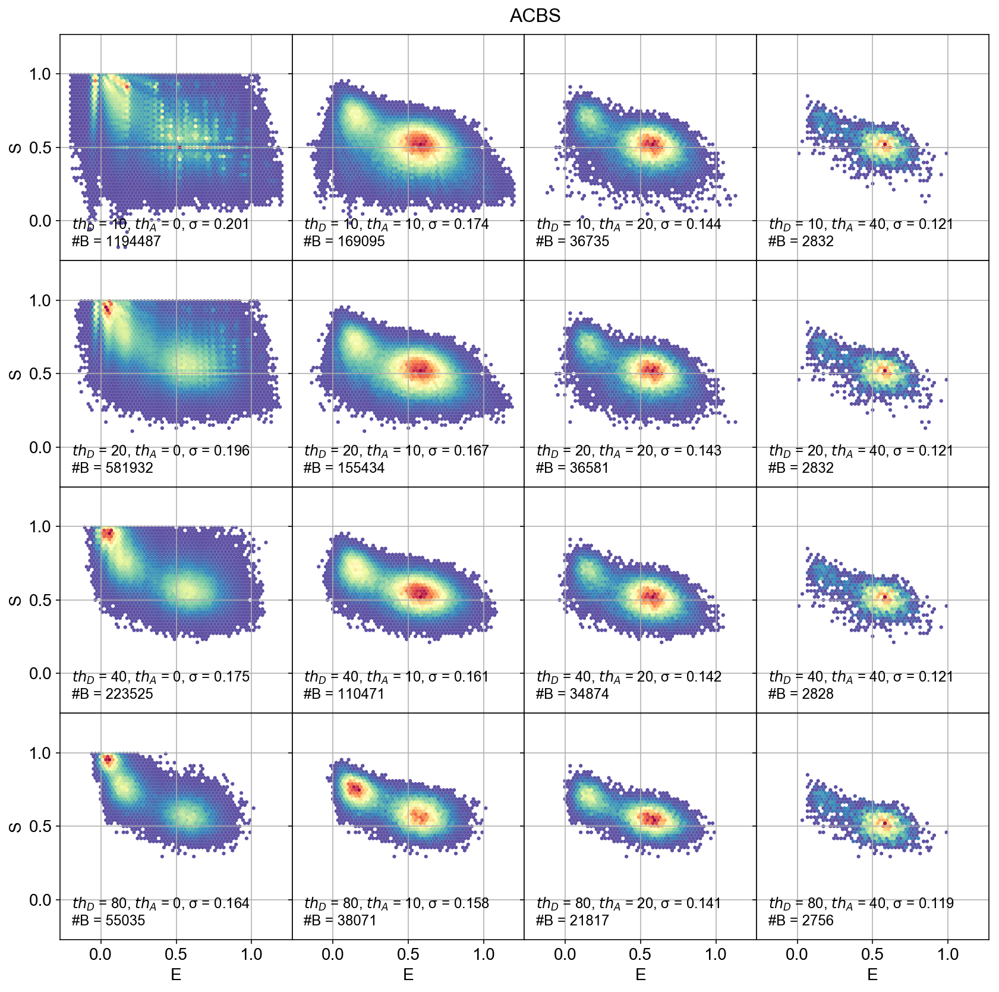

In [56]:
Th = (10, 20, 40, 80)
Th_naa = np.array((0, 10, 20, 40)) 
fig, AX = plt.subplots(len(Th), len(Th_naa), figsize=(3.5*len(Th_naa), 3.5*len(Th)), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    for icol, th_naa in enumerate(Th_naa):
        ax = AX[irow,icol]
        dcs_th1 = d.select_bursts(select_bursts.size, th1=th_naa, **naa_sel_kws)
        dcs_th2 = dcs_th1.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
        dcs_th = dcs_th2.collapse(update_gamma=False, skip_ch=skip_ch)
        Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs_th.nd, dcs_th.na, dcs_th.naa)]
        dcs_th.add(Su=Su)
        E = dcs_th.E[0]
        E_std = E[E > 0.2].std()
        dplot(dcs_th, hexbin_alex, S_name='Su', gridsize=60, ax=ax)
        ax.text(0.05, 0.05, '$th_D$ = %d, $th_A$ = %d, σ = %.3f\n#B = %d' % (th, th_naa, E_std, dcs_th.num_bursts), 
                va='bottom', ha='left', transform=ax.transAxes, fontsize=12)
        ax.set_title('')
plt.setp(AX[:-1], xlabel='')
plt.setp(AX[:, 1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.5, 0.89, 'ACBS', transform=fig.transFigure, fontsize=16);

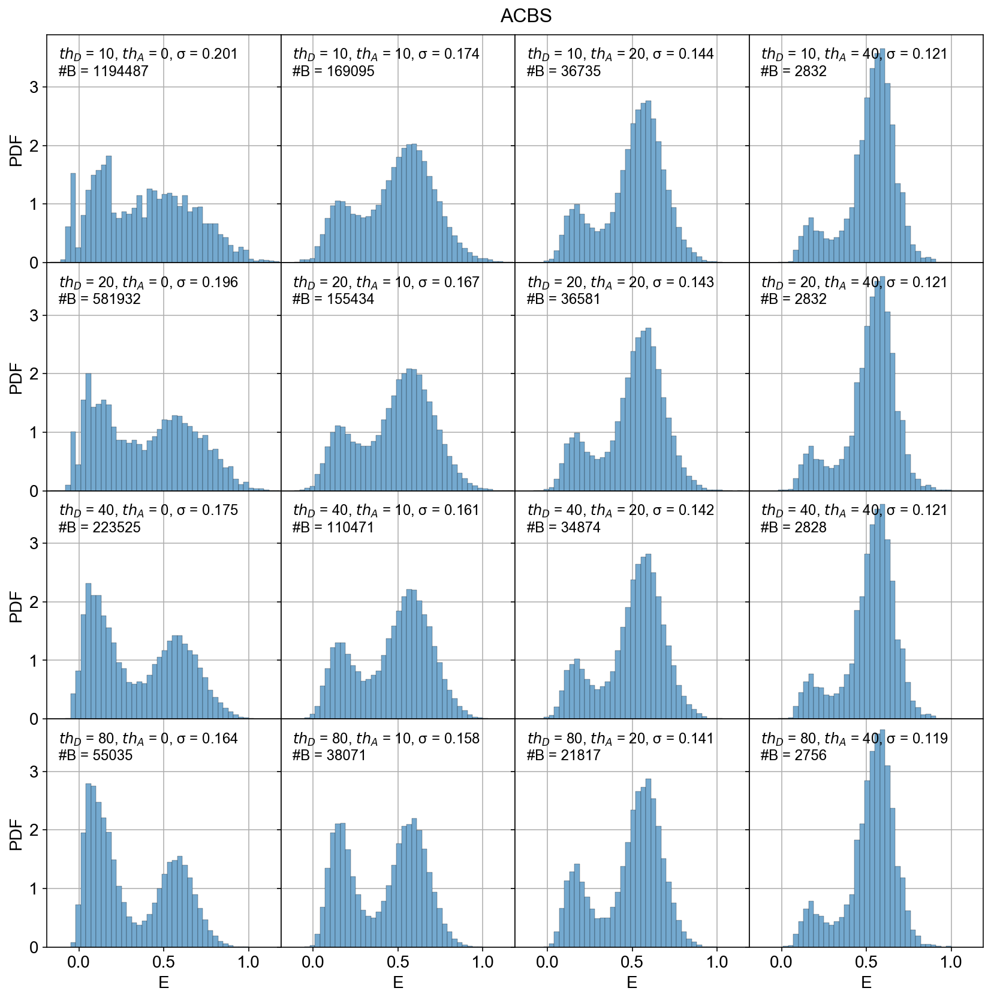

In [57]:
Th = (10, 20, 40, 80)
Th_naa = np.array((0, 10, 20, 40)) 
fig, AX = plt.subplots(len(Th), len(Th_naa), figsize=(3.5*len(Th_naa), 3.5*len(Th)), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    for icol, th_naa in enumerate(Th_naa):
        ax = AX[irow,icol]
        dcs_th1 = d.select_bursts(select_bursts.size, th1=th_naa, **naa_sel_kws)
        dcs_th2 = dcs_th1.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
        dcs_th = dcs_th2.collapse(update_gamma=False, skip_ch=skip_ch)
        dplot(dcs_th, hist_fret, ax=ax)
        E = dcs_th.E[0]
        E_std = E[E > 0.2].std()
        ax.text(0.05, 0.95, '$th_D$ = %d, $th_A$ = %d, σ = %.3f\n#B = %d' % (th, th_naa, E_std, dcs_th.num_bursts), 
                va='top', ha='left', transform=ax.transAxes, fontsize=12)
        ax.set_title('')
plt.setp(AX[:-1], xlabel='')
plt.setp(AX[:, 1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.5, 0.89, 'ACBS', transform=fig.transFigure, fontsize=16)

In [58]:
d2 = bext.burst_search_and_gate(d, min_rate_cps=(50e3, 25e3))

Deep copy executed.
Deep copy executed.
Deep copy executed.
 - Performing burst search (verbose=False) ... - Fixing  burst data to refer to ph_times_m ... [DONE]
[DONE]
 - Calculating burst periods ...[DONE]
 - Performing burst search (verbose=False) ... - Fixing  burst data to refer to ph_times_m ... [DONE]
[DONE]
 - Calculating burst periods ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   [DONE Counting D/A]


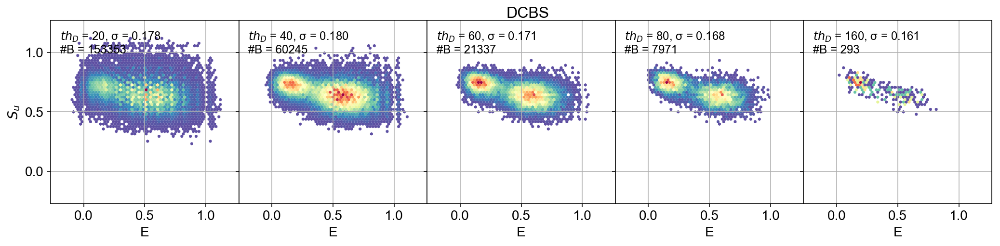

In [59]:
Th = (20, 40, 60, 80, 160)
fig, AX = plt.subplots(1, len(Th), figsize=(3.5*len(Th), 3.5), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    ax = AX[irow]
    dcs_th2 = d2.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
    dcs_th = dcs_th2.collapse(update_gamma=False, skip_ch=skip_ch)
    Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs_th.nd, dcs_th.na, dcs_th.naa)]
    dcs_th.add(Su=Su)
    dplot(dcs_th, hexbin_alex, S_name='Su', gridsize=60, ax=ax)
    E = dcs_th.E[0]
    E_std = E[E > 0.2].std()
    ax.text(0.05, 0.95, '$th_D$ = %d, σ = %.3f\n#B = %d' % (th, E_std, dcs_th.num_bursts), va='top', ha='left',
            transform=ax.transAxes, fontsize=12)
    ax.set_title('')
plt.setp(AX[1:], ylabel='')
AX[0].set_ylabel('$S_u$')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.5, 0.89, 'DCBS', transform=fig.transFigure, fontsize=16);

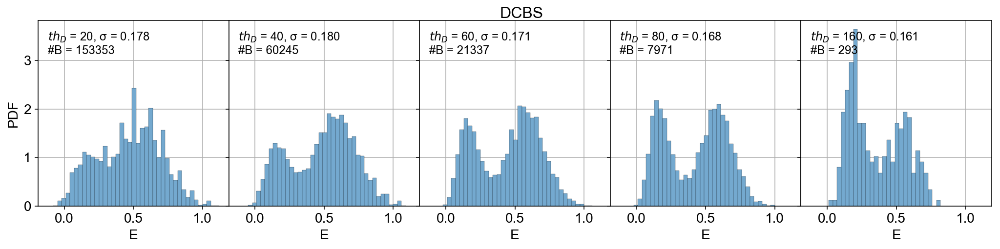

In [60]:
Th = (20, 40, 60, 80, 160)
fig, AX = plt.subplots(1, len(Th), figsize=(3.5*len(Th), 3.5), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    ax = AX[irow]
    dcs_th2 = d2.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
    dcs_th = dcs_th2.collapse(update_gamma=False, skip_ch=skip_ch)
    dplot(dcs_th, hist_fret, ax=ax)
    E = dcs_th.E[0]
    E_std = E[E > 0.2].std()
    ax.text(0.05, 0.95, '$th_D$ = %d, σ = %.3f\n#B = %d' % (th, E_std, dcs_th.num_bursts), va='top', ha='left',
            transform=ax.transAxes, fontsize=12)
    ax.set_title('')
plt.setp(AX[1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.5, 0.89, 'DCBS', transform=fig.transFigure, fontsize=16);

In [61]:
dc = d.collapse(update_gamma=False, skip_ch=skip_ch)

In [62]:
size_Dex = 80
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='Dem'), gamma=0.5,
                    na_comp=True, naa_comp=False, naa_aexonly=False)
dcs = dc.select_bursts(select_bursts.size, th1=size_Dex, **size_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs.nd, dcs.na, dcs.naa)]
dcs.add(Su=Su)
Math(d._burst_sizes_pax_formula(**size_sel_kws))

<IPython.core.display.Math object>

In [63]:
size_Aex = 25
naa_sel_kws = dict(ph_sel=Ph_sel(Aex='Aem'), gamma=0.5,
                   na_comp=False, naa_comp=False, naa_aexonly=False)
dcss = dcs.select_bursts(select_bursts.size, th1=size_Aex, **naa_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcss.nd, dcss.na, dcss.naa)]
dcss.add(Su=Su)
Math(d._burst_sizes_pax_formula(**naa_sel_kws))

<IPython.core.display.Math object>

Saved: figures/2017-07-11_06_12d_22d_ES-hist-collapsed-all-pops.png
Saved hires: figures/2017-07-11_06_12d_22d_ES-hist-collapsed-all-pops_highres.png
Saved: figures/2017-07-11_06_12d_22d_ES-hist-collapsed-FRET-pops.png
Saved hires: figures/2017-07-11_06_12d_22d_ES-hist-collapsed-FRET-pops_highres.png


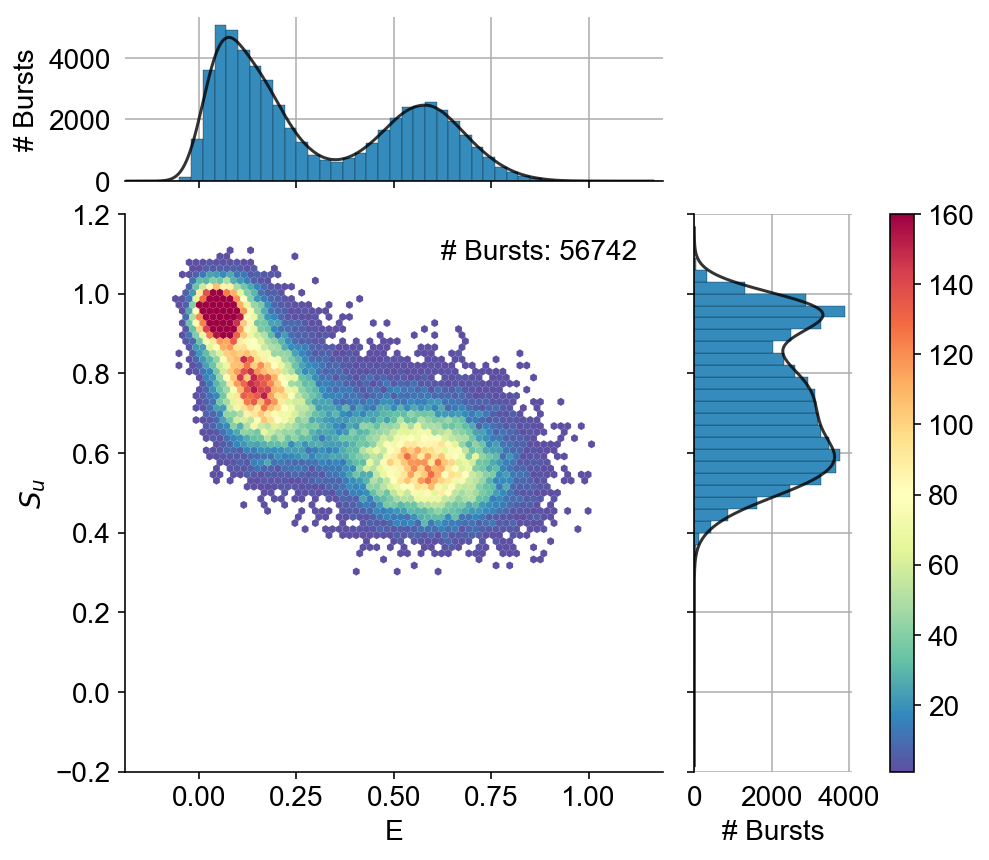

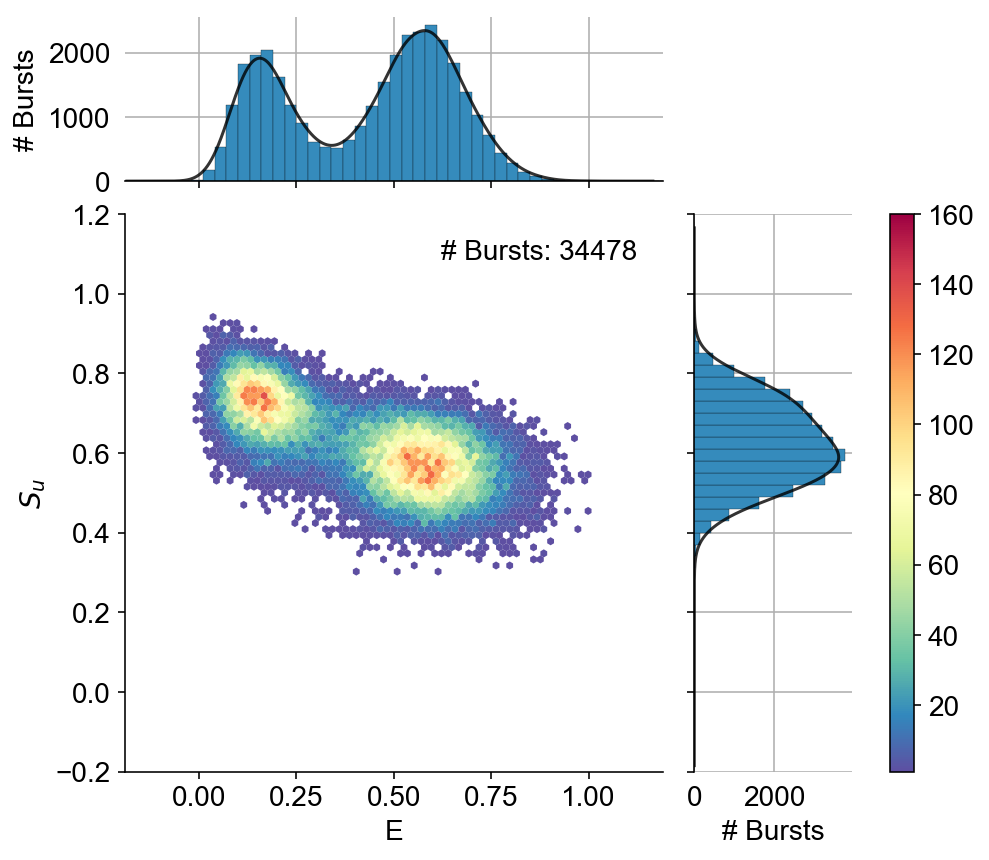

In [64]:
g = alex_jointplot(dcs, S_name='Su', vmax=160, gridsize=80)
g.ax_joint.set_ylabel('$S_u$');
savefig('ES-hist-collapsed-all-pops')
g = alex_jointplot(dcss, S_name='Su', vmax=160, gridsize=80)
g.ax_joint.set_ylabel('$S_u$');
savefig('ES-hist-collapsed-FRET-pops')

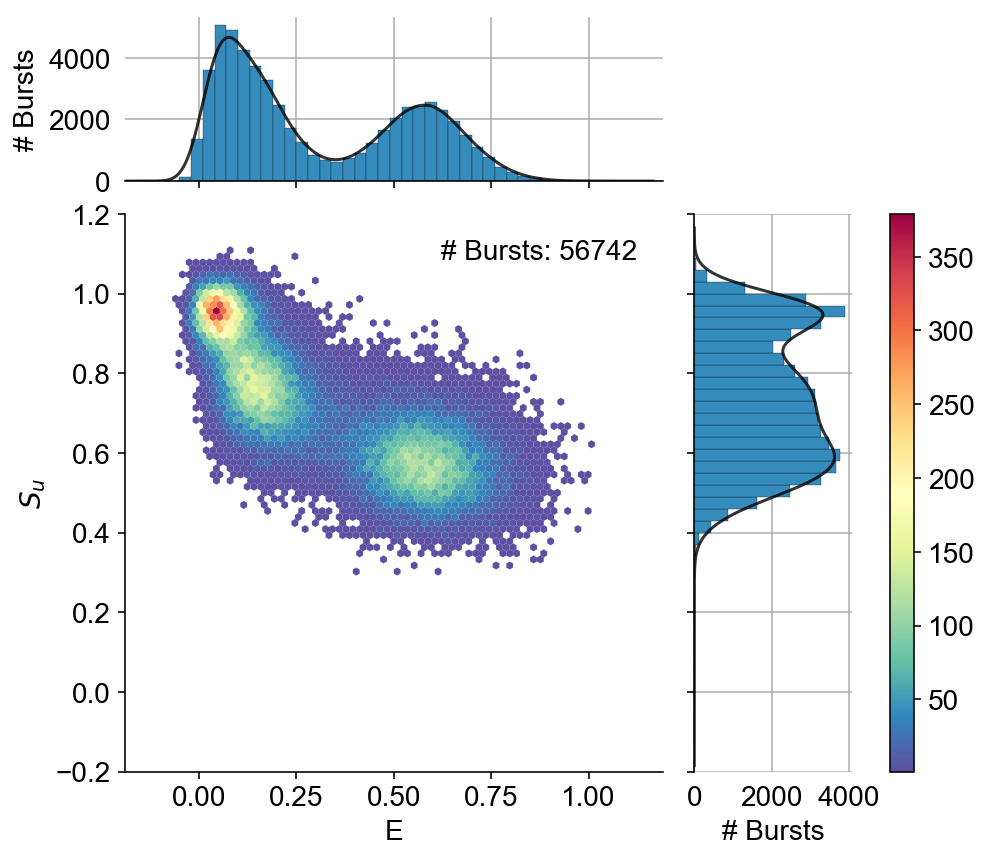

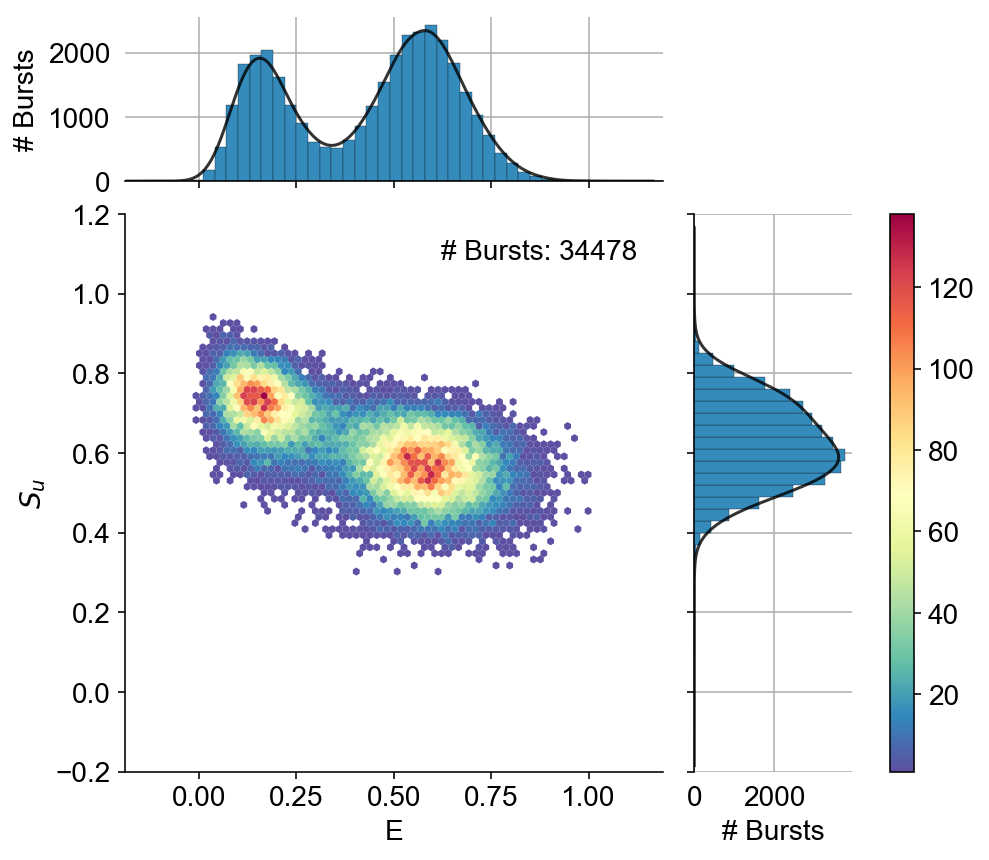

In [65]:
g = alex_jointplot(dcs, S_name='Su', vmax_fret=False, gridsize=80)
g.ax_joint.set_ylabel('$S_u$');
g = alex_jointplot(dcss, S_name='Su', vmax_fret=False, gridsize=80)
g.ax_joint.set_ylabel('$S_u$');

In [66]:
size_th = 40
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem'), gamma=0.5,
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dcs = dc.select_bursts(select_bursts.size, th1=size_th, **size_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs.nd, dcs.na, dcs.naa)]
dcs.add(Su=Su)
Math(d._burst_sizes_pax_formula(**size_sel_kws))

<IPython.core.display.Math object>

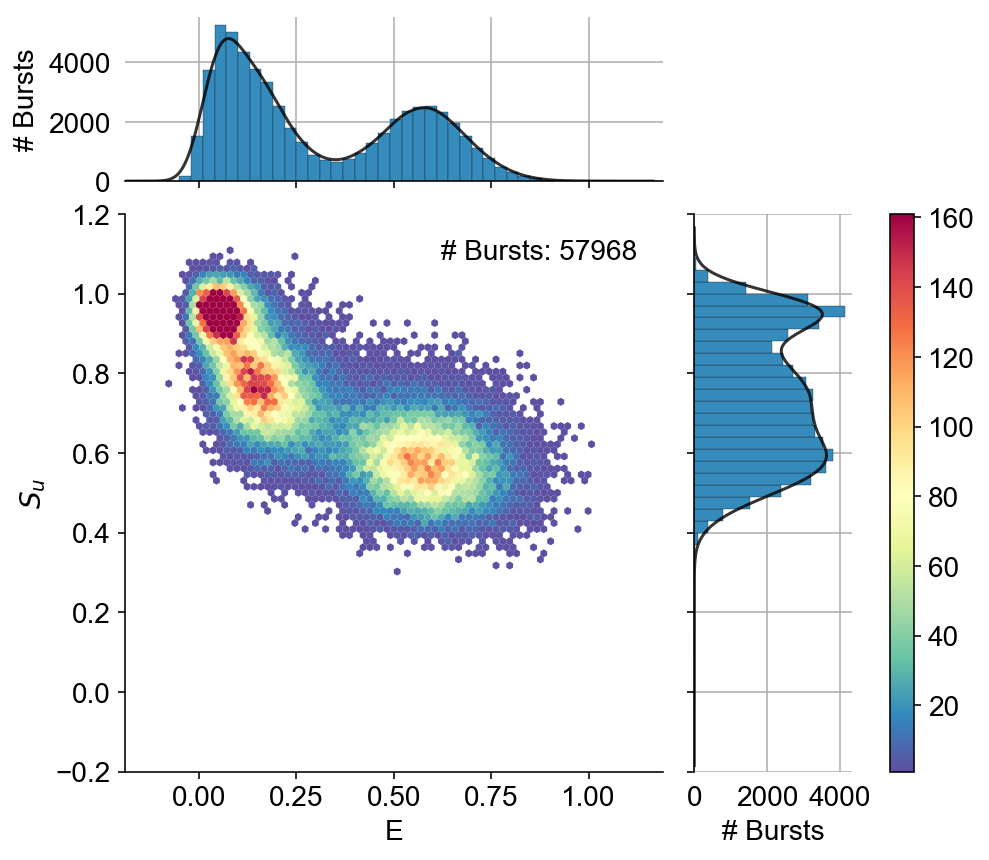

In [67]:
g = alex_jointplot(dcs, S_name='Su', vmax_fret=True, gridsize=80)
g.ax_joint.set_ylabel('$S_u$');

In [68]:
dcs15 = dcs.select_bursts(select_bursts.time, time_s1=0, time_s2=15)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs15.nd, dcs15.na, dcs15.naa)]
dcs15.add(Su=Su)

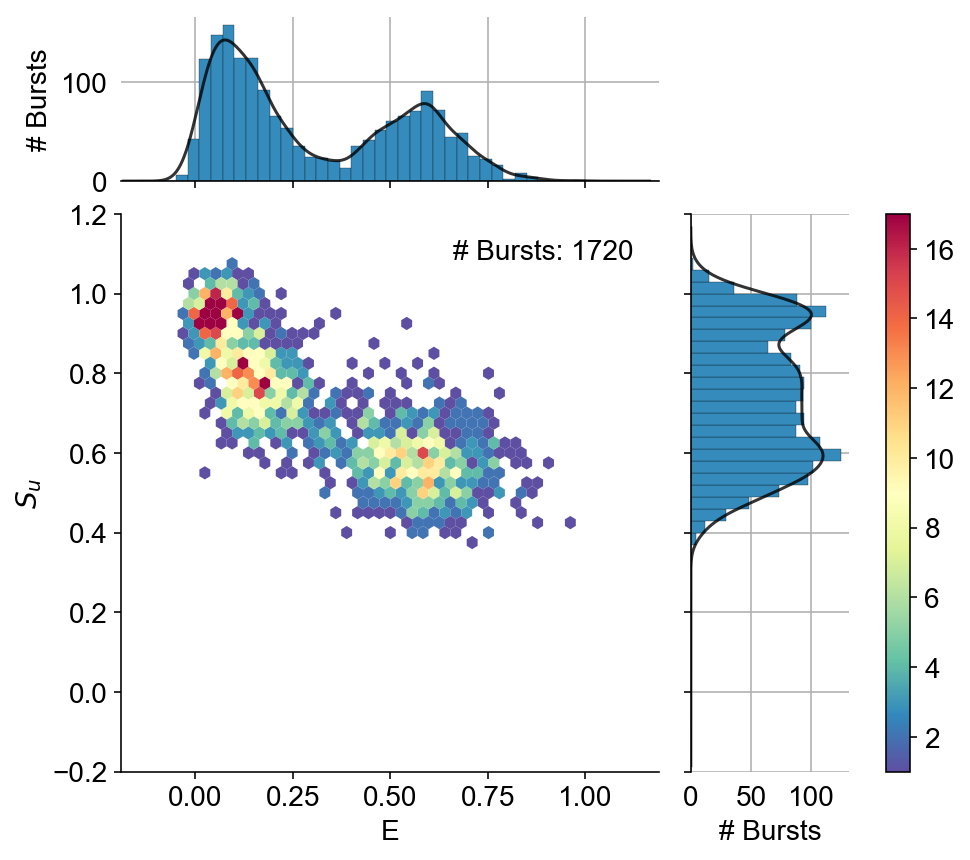

In [69]:
g = alex_jointplot(dcs15, S_name='Su')
g.ax_joint.set_ylabel('$S_u$');

In [70]:
dcs5 = dcs.select_bursts(select_bursts.time, time_s1=0, time_s2=5)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs5.nd, dcs5.na, dcs5.naa)]
dcs5.add(Su=Su)

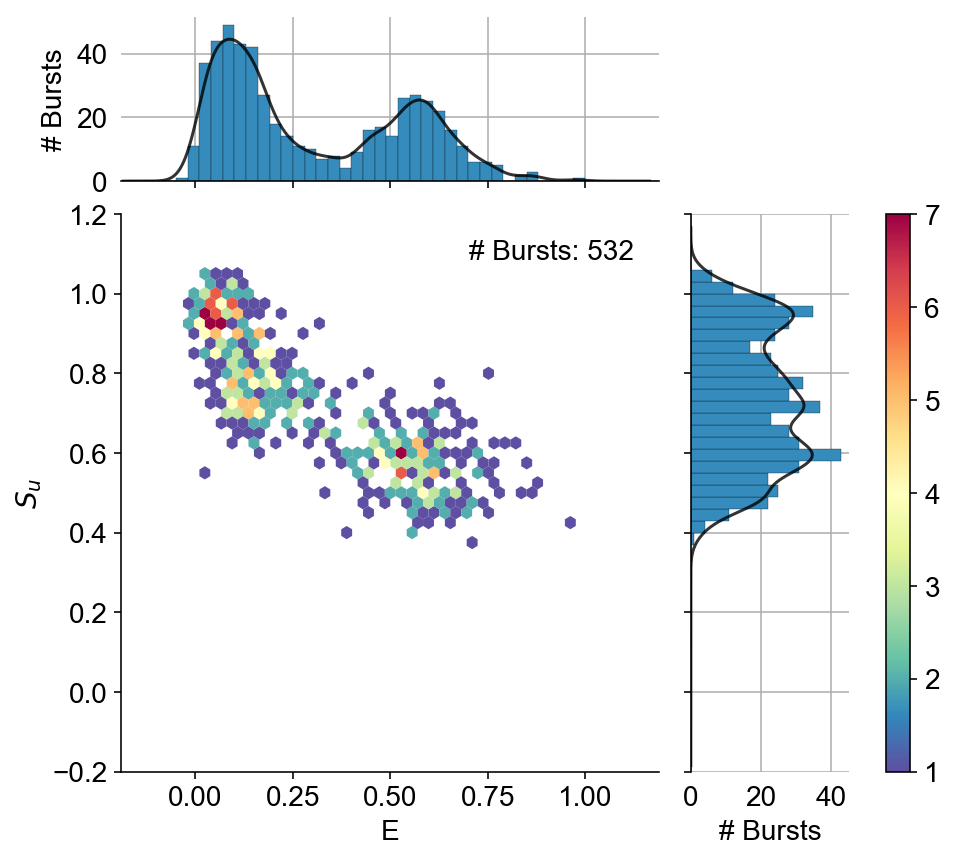

In [71]:
g = alex_jointplot(dcs5, S_name='Su')
g.ax_joint.set_ylabel('$S_u$');